<a href="https://colab.research.google.com/github/yulishadian/Image-Classification_270-268/blob/main/Image_Classification_5_Yunia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/kaggle.json"

In [3]:
%cd "/content/gdrive/MyDrive/Tugas Besar ML/Kaggle"

/content/gdrive/MyDrive/Tugas Besar ML/Kaggle


In [ ]:
!kaggle datasets download -d alxmamaev/flowers-recognition

 97% 219M/225M [00:04<00:00, 67.3MB/s]
100% 225M/225M [00:04<00:00, 49.3MB/s]


# Preprocessing

In [ ]:
!unzip "/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers-recognition.zip" -d "/content/gdrive/MyDrive/Tugas Besar ML/Kaggle"

Archive:  /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers-recognition.zip
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/100080576_f52e8ee070_n.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/10140303196_b88d3d6cec.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/10172379554_b296050f82_n.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/10172567486_2748826a8b.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/10172636503_21bededa75_n.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/102841525_bd6628ae3c.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/10300722094_28fa978807_n.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/1031799732_e7f4008c03.jpg  
  inflating: /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/daisy/10391248763_1d16681106_n.jpg

In [4]:
!ls

flowers  flowers-recognition.zip  kaggle.json  SplitingData


Import

In [5]:
import json
import os  # Create directories, list files
import zipfile
import shutil
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mping
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.np_utils import to_categorical
import tensorflow as tf
import matplotlib.pyplot as plt
from keras import layers,models

In [6]:
mypath= 'flowers/'

In [7]:
#untuk menetapkan directory

input_folder = "/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers"
base_dir = "/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/SplitingData"

In [ ]:
!pip install split_folders
import splitfolders

In [ ]:
splitfolders.ratio(input_folder, output = base_dir, seed=1337, ratio=(0.80,0.19,0.01))

Copying files: 4317 files [01:16, 56.49 files/s]


In [8]:
%cd /content/gdrive/MyDrive/Tugas Besar ML/Kaggle/SplitingData

/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/SplitingData


In [9]:
import os
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

train_daisy_dir = os.path.join(train_dir, 'daisy')
train_dandelion_dir = os.path.join(train_dir, 'dandelion')
train_rose_dir = os.path.join(train_dir, 'rose')
train_sunflower_dir = os.path.join(train_dir, 'sunflower')
train_tulip_dir = os.path.join(train_dir, 'tulip')

validation_daisy_dir = os.path.join(validation_dir, 'daisy')
validation_dandelion_dir = os.path.join(validation_dir, 'dandelion')
validation_rose_dir = os.path.join(validation_dir, 'rose')
validation_sunflower_dir = os.path.join(validation_dir, 'sunflower')
validation_tulip_dir = os.path.join(validation_dir, 'tulip')

test_daisy_dir = os.path.join(test_dir, 'daisy')
test_dandelion_dir = os.path.join(test_dir, 'dandelion')
test_rose_dir = os.path.join(test_dir, 'rose')
test_sunflower_dir = os.path.join(test_dir, 'sunflower')
test_tulip_dir = os.path.join(test_dir, 'tulip')

In [10]:
print('Train daisy :', os.listdir(train_daisy_dir)[:10])
print('Train dandelion :', os.listdir(train_dandelion_dir)[:10])
print('Train rose :', os.listdir(train_rose_dir)[:10])
print('Train sunflower :', os.listdir(train_sunflower_dir)[:10])
print('Train tulip :', os.listdir(train_tulip_dir)[:10])
print("\n")

print('Validation daisy :', os.listdir(validation_daisy_dir)[:10])
print('Validation dandelion :', os.listdir(validation_dandelion_dir)[:10])
print('Validation rose :', os.listdir(validation_rose_dir)[:10])
print('Train sunflower :', os.listdir(train_sunflower_dir)[:10])
print('Train tulip :', os.listdir(train_tulip_dir)[:10])
print("\n")

print('Test daisy :', os.listdir(test_daisy_dir)[:10])
print('Test dandelion :', os.listdir(test_dandelion_dir)[:10])
print('Test rose :', os.listdir(test_rose_dir)[:10])
print('Train sunflower :', os.listdir(train_sunflower_dir)[:10])
print('Train tulip :', os.listdir(train_tulip_dir)[:10])

Train daisy : ['11023214096_b5b39fab08.jpg', '14245834619_153624f836.jpg', '1314069875_da8dc023c6_m.jpg', '14088053307_1a13a0bf91_n.jpg', '1150395827_6f94a5c6e4_n.jpg', '1306119996_ab8ae14d72_n.jpg', '14147016029_8d3cf2414e.jpg', '14264136211_9531fbc144.jpg', '14073784469_ffb12f3387_n.jpg', '10172567486_2748826a8b.jpg']
Train dandelion : ['14070457521_8eb41f65fa.jpg', '18183515403_13a9ca6d86_n.jpg', '17831860736_3e44667bbb_n.jpg', '18215579866_94b1732f24.jpg', '19067907051_16d530c7d2.jpg', '16096748028_7876887ab2.jpg', '158988663_6fe055fcb4.jpg', '14335561523_f847f2f4f1.jpg', '15987457_49dc11bf4b.jpg', '151861297_55b10a03a6_n.jpg']
Train rose : ['11944957684_2cc806276e.jpg', '118974357_0faa23cce9_n.jpg', '14943194730_f48b4d4547_n.jpg', '15184419268_7230e9728e.jpg', '2332478138_28f1d586e4_n.jpg', '15174615529_144ae28bdb_n.jpg', '13211873833_82b029c8a1_n.jpg', '17990320484_93bba345d2_m.jpg', '15999816377_4b95e0b538_n.jpg', '16258946661_f9739cdc0a.jpg']
Train sunflower : ['10386503264_e05

In [11]:
print('Train daisy :', len(os.listdir(train_daisy_dir)))
print('Train dandelion :', len(os.listdir(train_dandelion_dir)))
print('Train rose :', len(os.listdir(train_rose_dir)))
print('Train sunflower :', len(os.listdir(train_sunflower_dir)))
print('Train tulip :', len(os.listdir(train_tulip_dir)))
print("\n")

print('Validation daisy :', len(os.listdir(validation_daisy_dir)))
print('Validation dandelion :', len(os.listdir(validation_dandelion_dir)))
print('Validation rose :', len(os.listdir(validation_rose_dir)))
print('Validation sunflower :', len(os.listdir(validation_sunflower_dir)))
print('Validation tulip :', len(os.listdir(validation_tulip_dir)))
print("\n")

print('Test daisy :', len(os.listdir(test_daisy_dir)))
print('Test dandelion :', len(os.listdir(test_dandelion_dir)))
print('Test rose :', len(os.listdir(test_rose_dir)))
print('Test sunflower :', len(os.listdir(test_sunflower_dir)))
print('Test tulip :', len(os.listdir(test_tulip_dir)))

Train daisy : 611
Train dandelion : 841
Train rose : 627
Train sunflower : 586
Train tulip : 787


Validation daisy : 145
Validation dandelion : 199
Validation rose : 148
Validation sunflower : 139
Validation tulip : 186


Test daisy : 8
Test dandelion : 12
Test rose : 9
Test sunflower : 8
Test tulip : 11


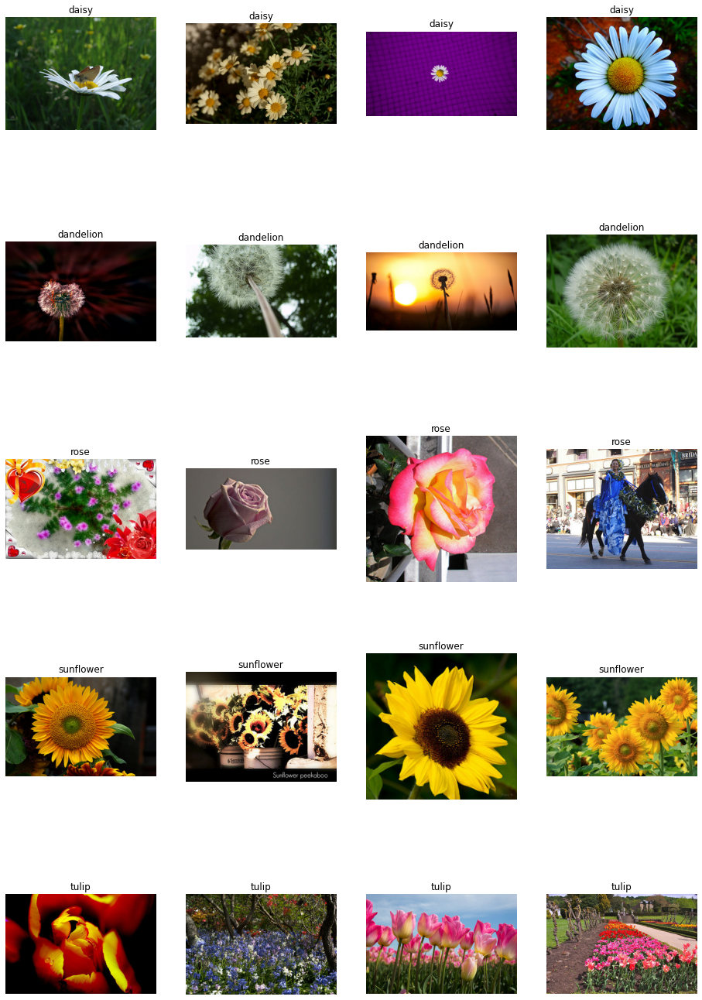

In [12]:
# Tampilkan 8 image per kelas dengan ukuran 4x4 

%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 5
ncols = 4

pic_index = 0

fig = plt.gcf()
fig.set_size_inches( ncols * 4,nrows * 5)

pic_index += 9

train_daisy = [os.path.join(train_daisy_dir, fname) 
                for fname in os.listdir(train_daisy_dir)[pic_index-4:pic_index]]

train_dandelion = [os.path.join(train_dandelion_dir, fname) 
                for fname in os.listdir(train_dandelion_dir)[pic_index-4:pic_index]]

train_rose = [os.path.join(train_rose_dir, fname) 
                for fname in os.listdir(train_rose_dir)[pic_index-4:pic_index]]

train_sunflower = [os.path.join(train_sunflower_dir, fname) 
                for fname in os.listdir(train_sunflower_dir)[pic_index-4:pic_index]]

train_tulip = [os.path.join(train_tulip_dir, fname) 
                for fname in os.listdir(train_tulip_dir)[pic_index-4:pic_index]]
                        

for i, img_path in enumerate(train_daisy+train_dandelion+train_rose+train_sunflower+train_tulip):
    
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)
  plt.title(img_path.split(os.path.sep)[-2])

plt.show()

In [13]:
import tensorflow as tf
import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

In [14]:
height = 150
width = 150
batch_size = 32

generator_datagen = ImageDataGenerator(
    rescale = 1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

val_gen = ImageDataGenerator(rescale = 1./255)

train_generator = generator_datagen.flow_from_directory(
    train_dir,
    target_size=(height, width),
    class_mode='categorical',
    color_mode="rgb",
    shuffle=True,
    batch_size=batch_size,
)

val_generator = val_gen.flow_from_directory(
    validation_dir,
    target_size=(height,width),
    class_mode='categorical',
    color_mode="rgb",
    shuffle=False,
    batch_size=batch_size
)

test_generator = val_gen.flow_from_directory(
    test_dir,
    target_size=(height,width),
    class_mode='categorical',
    color_mode="rgb",
    shuffle=False,
    batch_size=batch_size
)

Found 3452 images belonging to 5 classes.
Found 817 images belonging to 5 classes.
Found 48 images belonging to 5 classes.


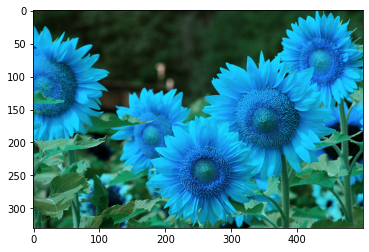

In [15]:
import random
import cv2

def add_noise(img):

	# Getting the dimensions of the image
	row , col = img.shape
	
	# Randomly pick some pixels in the
	# image for coloring them white
	# Pick a random number between 300 and 10000
	number_of_pixels = random.randint(300, 10000)
	for i in range(number_of_pixels):
	
		# Pick a random y coordinate
		y_coord=random.randint(0, row - 1)
		
		# Pick a random x coordinate
		x_coord=random.randint(0, col - 1)
		
		# Color that pixel to white
		img[y_coord][x_coord] = 255
		
	# Randomly pick some pixels in
	# the image for coloring them black
	# Pick a random number between 300 and 10000
	number_of_pixels = random.randint(300 , 10000)
	for i in range(number_of_pixels):
	
		# Pick a random y coordinate
		y_coord=random.randint(0, row - 1)
		
		# Pick a random x coordinate
		x_coord=random.randint(0, col - 1)
		
		# Color that pixel to black
		img[y_coord][x_coord] = 0
		
	return img

# salt-and-pepper noise can
# be applied only to grayscale images
# Reading the color image in grayscale image
img = cv2.imread('/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/sunflower/1008566138_6927679c8a.jpg',
				cv2.IMREAD_GRAYSCALE)

#Storing the image
cv2.imwrite('1008566138_6927679c8a.jpg',
			add_noise(img))

noise_img = cv2.imread('/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/sunflower/1008566138_6927679c8a.jpg')

plt.imshow(noise_img)

In [16]:
import cv2
import numpy as np

# Gather data train
train_data = []
train_label = []
for r, d, f in os.walk(train_dir):
    for file in f:
        if ".jpg" in file:
            imagePath = os.path.join(r, file)
            image = cv2.imread(imagePath)
            image = cv2.resize(image, (150,150))
            train_data.append(image)
            label = imagePath.split(os.path.sep)[-2]
            train_label.append(label)

train_data = np.array(train_data)
train_label = np.array(train_label)

In [17]:
# Gather data validation
val_data = []
val_label = []
for r, d, f in os.walk(validation_dir):
    for file in f:
        if ".jpg" in file:
            imagePath = os.path.join(r, file)
            image = cv2.imread(imagePath)
            image = cv2.resize(image, (150,150))
            val_data.append(image)
            label = imagePath.split(os.path.sep)[-2]
            val_label.append(label)

val_data = np.array(val_data)
val_label = np.array(val_label)

In [18]:
# Gather data test
test_data = []
test_label = []
for r, d, f in os.walk(test_dir):
    for file in f:
        if ".jpg" in file:
            imagePath = os.path.join(r, file)
            image = cv2.imread(imagePath)
            image = cv2.resize(image, (150,150))
            test_data.append(image)
            label = imagePath.split(os.path.sep)[-2]
            test_label.append(label)

test_data = np.array(test_data)
test_label = np.array(test_label)

In [19]:
# Tampilkan shape dari data train, data val dan data test
print("Train Data = ", train_data.shape)
print("Train Label = ", train_label.shape)
print("Val Data = ", val_data.shape)
print("Val Label = ", val_label.shape)
print("Test Data = ", test_data.shape)
print("Test Label = ", test_label.shape)

Train Data =  (3452, 150, 150, 3)
Train Label =  (3452,)
Val Data =  (817, 150, 150, 3)
Val Label =  (817,)
Test Data =  (48, 150, 150, 3)
Test Label =  (48,)


In [20]:
# Normalisasi dataset
print("Data sebelum di-normalisasi ", train_data[0][0][0])

x_train = train_data.astype('float32') / 255.0
x_test = test_data.astype('float32') / 255.0
x_val = val_data.astype('float32') / 255.0
print("Data setelah di-normalisasi ", x_train[0][0][0])

Data sebelum di-normalisasi  [203 197 198]
Data setelah di-normalisasi  [0.79607844 0.77254903 0.7764706 ]


In [21]:
# Transformasi label encoder
from sklearn.preprocessing import LabelEncoder

print("Label sebelum di-encoder = ", train_label[995:1005])

lb = LabelEncoder()
y_train = lb.fit_transform(train_label)
y_test = lb.fit_transform(test_label)
y_val = lb.fit_transform(val_label)

print("Label setelah di-encoder = ", y_train[995:1005])

Label sebelum di-encoder =  ['dandelion' 'dandelion' 'dandelion' 'dandelion' 'dandelion' 'dandelion'
 'dandelion' 'dandelion' 'dandelion' 'dandelion']
Label setelah di-encoder =  [1 1 1 1 1 1 1 1 1 1]


Smote

In [22]:
from imblearn.over_sampling import SMOTE

In [23]:
smote = SMOTE()

In [24]:
y_train.shape

(3452,)

In [25]:
x_train.shape

(3452, 150, 150, 3)

In [26]:
print("Before OverSampling, counts of label '0': {}".format(sum(y_train == 0)))
print("Before OverSampling, counts of label '1': {} \n".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '2': {}".format(sum(y_train == 2)))
print("Before OverSampling, counts of label '3': {} \n".format(sum(y_train == 3)))

Before OverSampling, counts of label '0': 611
Before OverSampling, counts of label '1': 841 

Before OverSampling, counts of label '2': 627
Before OverSampling, counts of label '3': 586 



In [27]:
x_train = np.random.rand(3452, 150, 150, 3)
orig_shape = x_train.shape
print(orig_shape)

(3452, 150, 150, 3)


In [28]:
x_train = x_train.reshape(3452,3*150*150)
print(x_train.shape)

(3452, 67500)


In [29]:
x_train.shape

(3452, 67500)

In [30]:
x_smote_train, y_smote_train = smote.fit_resample(x_train,y_train)

In [31]:
x_smote_train.shape

(4205, 67500)

In [32]:
x_smote_train = np.random.rand(4205, 150, 150,3)
orig_shape_smote = x_smote_train.shape
print(orig_shape_smote)

(4205, 150, 150, 3)


In [33]:
from collections import Counter


In [34]:
print("Before SMOTE = ", Counter(y_train))
print("After SMOTE = ", Counter(y_smote_train))

Before SMOTE =  Counter({1: 841, 4: 787, 2: 627, 0: 611, 3: 586})
After SMOTE =  Counter({0: 841, 1: 841, 2: 841, 3: 841, 4: 841})


In [35]:
x_smote_train.shape

(4205, 150, 150, 3)

In [36]:
from tensorflow.keras.utils import to_categorical

In [37]:
y_train_one_hot = to_categorical(y_train)
y_val_one_hot = to_categorical(y_val)


In [38]:
y_train_one_hot_smote = to_categorical(y_smote_train)

EDA

In [39]:
print('Train daisy :', len(os.listdir(train_daisy_dir)))
print('Train dandelion :', len(os.listdir(train_dandelion_dir)))
print('Train rose :', len(os.listdir(train_rose_dir)))
print('Train sunflower :', len(os.listdir(train_sunflower_dir)))
print('Train tulip :', len(os.listdir(train_tulip_dir)))

Train daisy : 611
Train dandelion : 841
Train rose : 627
Train sunflower : 586
Train tulip : 787


In [40]:
print("SEBELUM SMOTE")
print("Jumlah Train Gambar = "+str(len(x_train)))
print("Jumlah Train Label = "+str(len(y_train)))
print("Jumlah Gambar Per-class = "+str(Counter(y_train)))
print(" ")
print("SETELAH SMOTE")
print("Jumlah Train Gambar = "+str(len(x_smote_train)))
print("Jumlah Train Label = "+str(len(y_smote_train)))
print("Jumlah Gambar Per-class = "+str(Counter(y_smote_train)))


SEBELUM SMOTE
Jumlah Train Gambar = 3452
Jumlah Train Label = 3452
Jumlah Gambar Per-class = Counter({1: 841, 4: 787, 2: 627, 0: 611, 3: 586})
 
SETELAH SMOTE
Jumlah Train Gambar = 4205
Jumlah Train Label = 4205
Jumlah Gambar Per-class = Counter({0: 841, 1: 841, 2: 841, 3: 841, 4: 841})


Model 2

In [48]:
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras import layers

In [49]:
base_model = InceptionV3(include_top=False,
                         input_shape = (150, 150, 3),
                         weights = 'imagenet',
                         pooling = max)
for layer in base_model.layers:
  layer.trainable = False

In [50]:
x = layers.Flatten()(base_model.output)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.5)(x)                 
x = layers.Dense(5, activation='softmax')(x) 

model2 = Model(base_model.input, x)

model2.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_188 (Conv2D)            (None, 74, 74, 32)   864         ['input_3[0][0]']                
                                                                                                  
 batch_normalization_188 (Batch  (None, 74, 74, 32)  96          ['conv2d_188[0][0]']             
 Normalization)                                                                                   
                                                                                              

In [51]:
from tensorflow.keras.callbacks import EarlyStopping

class MyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if logs.get('val_acc') > 1.00:
            print("\nReached accuracy threshold! Terminating training.")
            self.model.stop_training = True
            
my_callback = MyCallback()

#EarlyStopping callback to make sure model is always learning
early_stopping = EarlyStopping(monitor='val_loss', patience=2)

In [52]:
from tensorflow.keras.optimizers import Adam

CALLBACKS = [my_callback]

model2.compile(optimizer=Adam(learning_rate=0.001, decay=0.001/32), # decay = learning_rate / batch_size 
              loss='categorical_crossentropy', 
              metrics=['acc'])

In [53]:
history = model2.fit(train_generator, batch_size=32, epochs=150, validation_data = val_generator, callbacks=CALLBACKS)

Epoch 1/150
108/108 [==============================] - 65s 459ms/step - loss: 1.6896 - acc: 0.5794 - val_loss: 0.7257 - val_acc: 0.7295
Epoch 2/150
108/108 [==============================] - 49s 453ms/step - loss: 0.8501 - acc: 0.6840 - val_loss: 0.6699 - val_acc: 0.7368
Epoch 3/150
108/108 [==============================] - 44s 410ms/step - loss: 0.7665 - acc: 0.7080 - val_loss: 0.5602 - val_acc: 0.8005
Epoch 4/150
108/108 [==============================] - 45s 413ms/step - loss: 0.6882 - acc: 0.7454 - val_loss: 0.4941 - val_acc: 0.8335
Epoch 5/150
108/108 [==============================] - 45s 413ms/step - loss: 0.6010 - acc: 0.7839 - val_loss: 0.5212 - val_acc: 0.8372
Epoch 6/150
108/108 [==============================] - 45s 412ms/step - loss: 0.6021 - acc: 0.7827 - val_loss: 0.4781 - val_acc: 0.8299
Epoch 7/150
108/108 [==============================] - 44s 411ms/step - loss: 0.5582 - acc: 0.7992 - val_loss: 0.6460 - val_acc: 0.8078
Epoch 8/150
108/108 [===========================

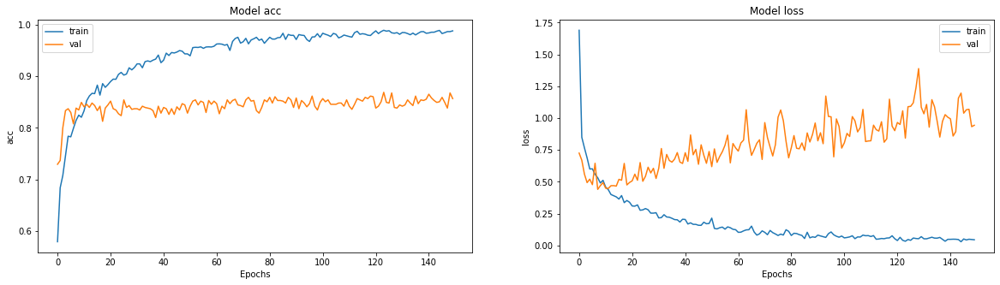

In [54]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize = (20, 5))
ax = ax.ravel()

for i, metric in enumerate(["acc", "loss"]):
    ax[i].plot(history.history[metric])
    ax[i].plot(history.history["val_" + metric])
    ax[i].set_title("Model {}".format(metric))
    ax[i].set_xlabel("Epochs")
    ax[i].set_ylabel(metric)
    ax[i].legend(["train", "val"])

In [55]:
train_scores = model2.evaluate(train_generator)
val_scores = model2.evaluate(val_generator)
test_scores = model2.evaluate(test_generator)

print("Training Accuracy: %.2f%%"%(train_scores[1] * 100))
print("Validation Accuracy: %.2f%%"%(val_scores[1] * 100))
print("Testing Accuracy: %.2f%%"%(test_scores[1] * 100))

2/2 [==============================] - 2s 1s/step - loss: 2.1147 - acc: 0.7708
Training Accuracy: 98.96%
Validation Accuracy: 85.68%
Testing Accuracy: 77.08%


In [56]:
from sklearn.metrics import classification_report
import numpy as np

target_names = []

for key in train_generator.class_indices:
    target_names.append(key)

pred_labels = model2.predict(test_generator)
y_pred = np.argmax(pred_labels, axis=1)

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=target_names))

Classification Report
              precision    recall  f1-score   support

       daisy       0.86      0.75      0.80         8
   dandelion       0.91      0.83      0.87        12
        rose       0.67      0.67      0.67         9
   sunflower       0.73      1.00      0.84         8
       tulip       0.70      0.64      0.67        11

    accuracy                           0.77        48
   macro avg       0.77      0.78      0.77        48
weighted avg       0.78      0.77      0.77        48



In [57]:
#Plot the confusion matrix. Set Normalize = True/False
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion Matrix', cmap=plt.cm.Blues):

    plt.figure(figsize=(7,7))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = np.around(cm, decimals=2)
        cm[np.isnan(cm)] = 0.0
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion Matrix
Normalized confusion matrix


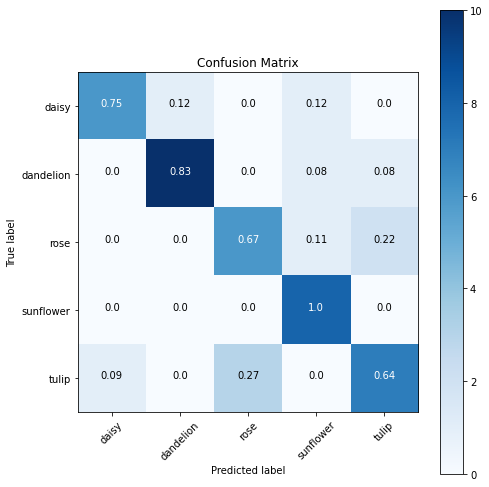

In [58]:
print('Confusion Matrix')
cm = confusion_matrix(test_generator.classes, y_pred)
plot_confusion_matrix(cm, target_names, title="Confusion Matrix" )

In [59]:
from tensorboard.plugins.hparams import api as hp
%load_ext tensorboard

In [60]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [61]:
!rm -rf ./logs/ 

In [68]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([64, 128]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.2, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd']))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')])

In [69]:
xvl, yvl = zip(*(val_generator[i] for i in range(len(val_generator))))
x_val, y_val = np.vstack(xvl), np.vstack(yvl)

In [70]:
# Feature Extraction Layer
def train_test_model(hparams):

  model2.compile(
      optimizer=hparams[HP_OPTIMIZER],
      loss='categorical_crossentropy',
      metrics=['accuracy'],
  )

  model2.fit(train_generator, 
            validation_data=val_generator, 
            epochs=5,
            )
  _, accuracy = model2.evaluate(x_val, y_val)
  return accuracy

In [71]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=50)

In [ ]:
session_num = 0

for num_units in HP_NUM_UNITS.domain.values:
  for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
    for optimizer in HP_OPTIMIZER.domain.values:
      hparams = {
          HP_NUM_UNITS: num_units,
          HP_DROPOUT: dropout_rate,
          HP_OPTIMIZER: optimizer,
      }
      run_name = "run-%d" % session_num
      print('--- Starting trial: %s' % run_name)
      print({h.name: hparams[h] for h in hparams})
      run('logs/hparam_tuning/' + run_name, hparams)
      session_num += 1

--- Starting trial: run-0
{'num_units': 64, 'dropout': 0.2, 'optimizer': 'adam'}
Epoch 1/5
108/108 [==============================] - 51s 422ms/step - loss: 0.0975 - accuracy: 0.9748 - val_loss: 1.2464 - val_accuracy: 0.8446
Epoch 2/5
108/108 [==============================] - 45s 421ms/step - loss: 0.0602 - accuracy: 0.9820 - val_loss: 1.1568 - val_accuracy: 0.8458
Epoch 3/5
108/108 [==============================] - 44s 408ms/step - loss: 0.0472 - accuracy: 0.9867 - val_loss: 1.0834 - val_accuracy: 0.8531
Epoch 4/5
108/108 [==============================] - 44s 408ms/step - loss: 0.0820 - accuracy: 0.9786 - val_loss: 1.1681 - val_accuracy: 0.8323
Epoch 5/5
26/26 [==============================] - 5s 116ms/step - loss: 0.9451 - accuracy: 0.8592
--- Starting trial: run-1
{'num_units': 64, 'dropout': 0.2, 'optimizer': 'sgd'}
Epoch 1/5
108/108 [==============================] - 51s 423ms/step - loss: 0.0377 - accuracy: 0.9881 - val_loss: 0.9315 - val_accuracy: 0.8592
Epoch 2/5
108/108 [=

In [1]:
%load_ext tensorboard

In [2]:
%cd /content/drive/MyDrive/Modul5/summary

[Errno 2] No such file or directory: '/content/drive/MyDrive/Modul5/summary'
/content


In [3]:
%tensorboard --logdir logs/hparam_tuning

<IPython.core.display.Javascript object>

In [ ]:
model2.save('model_2.tflite')

loaded_model2 = tf.keras.models.load_model('model_2.tflite')
loaded_model2.layers[0].input_shape #(None, 150, 150, 3)

In [ ]:
from keras import models
from PIL import Image

img_upload = Image.open("/content/gdrive/MyDrive/Tugas Besar ML/Kaggle/flowers/sunflower/1008566138_6927679c8a.jpg")
img_plt = plt.imshow(img_upload)
img = np.array(img_upload)
img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2RGB)

model_list = ['/content/drive/MyDrive/Modul5/summary/model_2.tflite']
labels = ['daisy', 'dandelion','sunflower','rose','tulip']

for m in model_list:
    model = models.load_model(m)
    # size_img = model.layers[0].output_shape[1:3]
    imgs = cv2.resize(img, (150,150))
    imgs = imgs.astype('float32') / 255
    pred = model.predict(np.expand_dims(imgs, axis=0))[0]
    print('Model :', m.split('/')[-1])
    print('Predicted Label :',labels[((pred > 0.5)+0).ravel()[0]])
    print('Probability :',[ round(elem, 4) for elem in pred ][0])
    print('===============\n')